# Cashew Disease Classification Using Convolutional Neural Networks (CNN)

In this project, we will implement a machine learning model using Convolutional Neural Networks (CNN) to classify diseases in cashew trees based on images of their leaves. The goal is to automate the process of detecting diseases, which can help farmers manage crop health and improve productivity.

### Objectives
- Preprocess and prepare a dataset of images containing cashew leaves affected by various diseases.
- Implement a CNN model to learn patterns in the images and classify them into different categories.
- Evaluate the model's performance using metrics such as accuracy, precision, recall, and F1-score.

### Key Steps
1. **Data Collection**: We will gather images of healthy and diseased cashew leaves. These images will serve as our dataset.
2. **Data Preprocessing**: Resize, normalize, and augment the images to prepare them for training.
3. **Model Building**: Implement using Keras/TensorFlow to classify the images.
4. **Training**: Train the CNN model on the preprocessed dataset.
5. **Evaluation**: Evaluate the model's performance using test data and metrics.
6. **Prediction**: Test the model with new, unseen images to predict disease classification.

By the end of this project, we aim to develop a robust model that can assist in early disease detection for cashew trees, ultimately aiding in better crop management and yield.

Let's get started by loading the dataset and performing some initial exploration!


# 1. Setup and importing necessary libraries

## 1.1 Ignoring warnings shown in the notebook

In [1]:
import warnings
warnings.filterwarnings('ignore')

## 1.2 Installing gdown in the environment

Gdown : Used to download a public file/folder from Google Drive. Gdown provides what curl/wget doesn't for Google Drive.

In [2]:
!pip install gdown

## 1.3 Necessary Imports

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import cv2
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tqdm import tqdm
import os
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, TensorBoard, ModelCheckpoint
from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay, accuracy_score
import ipywidgets as widgets
import io
from PIL import Image
from IPython.display import display,clear_output

## 1.4 Setting up color pallets

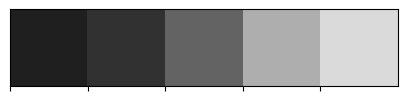

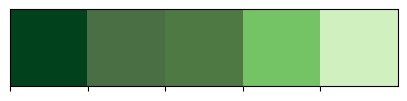

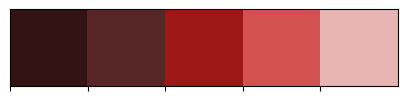

In [4]:
colors_dark = ["#1F1F1F", "#313131", '#636363', '#AEAEAE', '#DADADA']
colors_red = ["#331313", "#582626", '#9E1717', '#D35151', '#E9B4B4']
colors_green = ['#01411C','#4B6F44','#4F7942','#74C365','#D0F0C0']

sns.palplot(colors_dark)
sns.palplot(colors_green)
sns.palplot(colors_red)

## 1.5 Setting up label/class names

In [5]:
labels = ['anthracnose','gumosis','healthy','leaf miner',"red rust"]
CLASS_NAMES = labels

# 2. Exploratory data analysis

## 2.1 Identifying the proportion of each class.

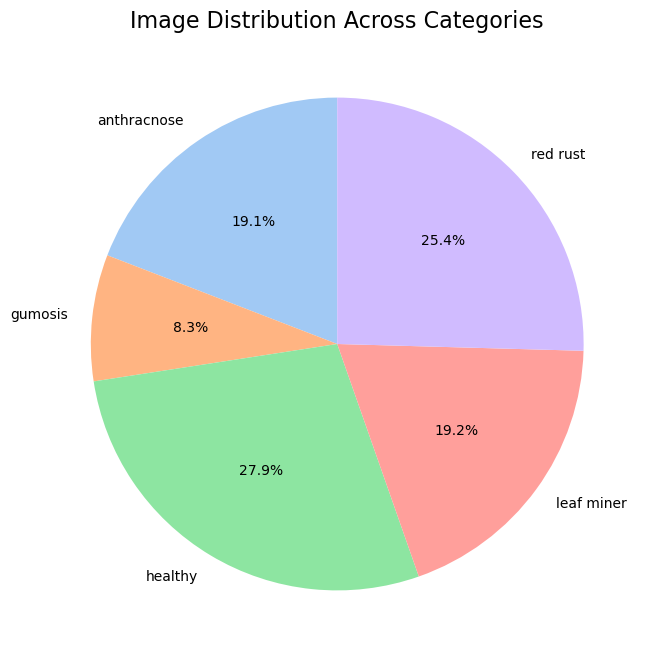

In [10]:
train_path = r'archive\Cashew\train_set'
test_path = r'archive\Cashew\test_set'

category_counts = {}

for category in os.listdir(train_path):
    category_folder = os.path.join(train_path, category)
    if os.path.isdir(category_folder):
        train_count = len(os.listdir(category_folder))
        category_counts[category] = train_count

for category in os.listdir(test_path):
    category_folder = os.path.join(test_path, category)
    if os.path.isdir(category_folder):
        test_count = len(os.listdir(category_folder))
        category_counts[category] = category_counts.get(category, 0) + test_count

labels = list(category_counts.keys())
counts = list(category_counts.values())

colors = sns.color_palette("pastel", len(labels))

plt.figure(figsize=(8, 8))
plt.pie(counts, labels=labels, autopct='%1.1f%%', startangle=90, colors=colors)
plt.title("Image Distribution Across Categories", fontsize=16)
plt.show()


Results : As we can see, data set is pretty much balanced except the gumosis class.

## 2.2 Identifying the number of images in each class

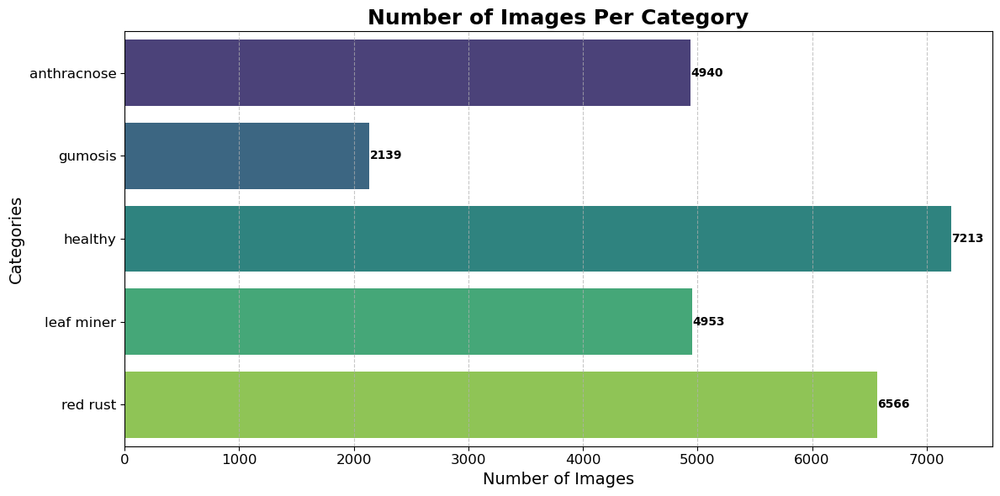

In [11]:
plt.figure(figsize=(12, 6))
sns.barplot(x=counts, y=labels, palette="viridis", orient="h")

for i, count in enumerate(counts):
    plt.text(count + 0.5, i, str(count), va='center', fontsize=10, fontweight='bold', color='black')


plt.title("Number of Images Per Category", fontsize=18, fontweight='bold')
plt.xlabel("Number of Images", fontsize=14)
plt.ylabel("Categories", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()

# Show the chart
plt.show()

## 2.3 Identifying the Image Dimension Distribution

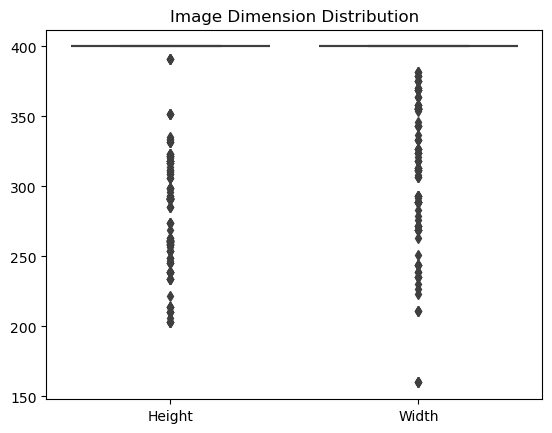

In [12]:
image_dimensions = []

for category in os.listdir(train_path):
    category_folder = os.path.join(train_path, category)
    if os.path.isdir(category_folder):
        for img in os.listdir(category_folder):
            img_path = os.path.join(category_folder, img)
            img_dim = plt.imread(img_path).shape
            image_dimensions.append(img_dim[:2])  # (height, width)

# Convert to DataFrame for analysis
import pandas as pd
df_dims = pd.DataFrame(image_dimensions, columns=["Height", "Width"])
sns.boxplot(data=df_dims)
plt.title("Image Dimension Distribution")
plt.show()

## 2.4 Visualizing samples from each class

In [13]:
X_train = []
y_train = []
image_size = 224
for i in labels:
    folderPath = os.path.join(r'archive\Cashew','train_set',i)
    for j in tqdm(os.listdir(folderPath)):
        img = cv2.imread(os.path.join(folderPath,j))
        img = cv2.resize(img,(image_size, image_size))
        X_train.append(img)
        y_train.append(i)
        
for i in labels:
    folderPath = os.path.join(r'archive\Cashew','test_set',i)
    for j in tqdm(os.listdir(folderPath)):
        img = cv2.imread(os.path.join(folderPath,j))
        img = cv2.resize(img,(image_size,image_size))
        X_train.append(img)
        y_train.append(i)
        
X_train = np.array(X_train)
y_train = np.array(y_train)

100%|██████████| 1815/1815 [00:29<00:00, 62.11it/s]


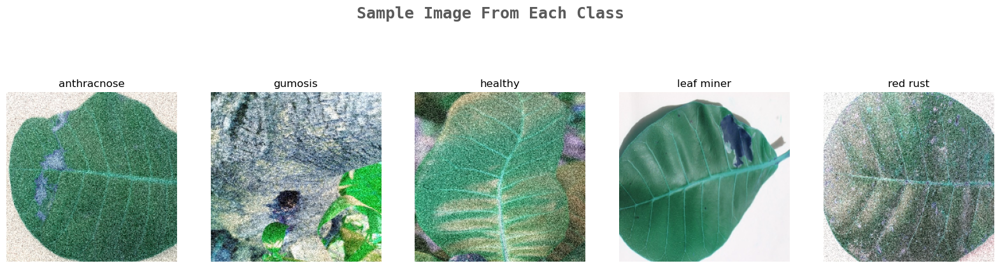

In [14]:
k=0
fig, ax = plt.subplots(1,5,figsize=(20,20))
fig.text(s='Sample Image From Each Class',size=18,fontweight='bold',
             fontname='monospace',color=colors_dark[1],y=0.62,x=0.4,alpha=0.8)
for i in labels:
    j=0
    while True :
        if y_train[j]==i:
            ax[k].imshow(X_train[j])
            ax[k].set_title(y_train[j])
            ax[k].axis('off')
            k+=1
            break
        j+=1

# 3. Getting the training and testing data ready

## 3.1 Shuffling the data for the randomness

In [15]:
X_train, y_train = shuffle(X_train,y_train, random_state=101)

In [16]:
X_train.shape # Shape of the X_train
# (Number of images , image size, image size, number of color channels)

(25811, 224, 224, 3)

## 3.2 Train and test split 

#### Test size : 20%

In [17]:
X_train,X_test,y_train,y_test = train_test_split(X_train,y_train, test_size=0.2,random_state=101)

## 3.3 One Hot Encoding of the labels

In [18]:
y_train_new = []
for i in y_train:
    y_train_new.append(labels.index(i))
y_train = y_train_new
y_train = tf.keras.utils.to_categorical(y_train)


y_test_new = []
for i in y_test:
    y_test_new.append(labels.index(i))
y_test = y_test_new
y_test = tf.keras.utils.to_categorical(y_test)

# 4. Setting up the neural net and training

## 4.1 Transfer Learning

Deep convolutional neural network models may take days or even weeks to train on very large datasets.

A way to short-cut this process is to re-use the model weights from pre-trained models that were developed for standard computer vision benchmark datasets, such as the `ImageNet` image recognition tasks. Top performing models can be downloaded and used directly, or integrated into a new model for your own computer vision problems.

In this Project, We'll be using the `EfficientNetB0` model which will use the weights from the `ImageNet` dataset.

The `include_top` parameter is set to False so that the network doesn't include the top layer/output layer from the pre-built model which allows us to add our own output layer depending upon our use case!

In [19]:
effnet = EfficientNetB0(weights='imagenet',include_top=False,input_shape=(image_size,image_size,3))

16705208/16705208 [==============================] - 4s 0us/step


## 4.2 Layers

**`GlobalAveragePooling2D`** -> This layer acts similar to the Max Pooling layer in CNNs, the only difference being is that it uses the Average values instead of the Max value while pooling. This really helps in decreasing the computational load on the machine while training.

**`Dropout`** -> This layer omits some of the neurons at each step from the layer making the neurons more independent from the neibouring neurons. It helps in avoiding overfitting. Neurons to be ommitted are selected at random. The rate parameter is the liklihood of a neuron activation being set to 0, thus dropping out the neuron

**`Dense`** -> This is the output layer which classifies the image into 1 of the 5 possible classes. It uses the softmax function which is a generalization of the sigmoid function.

In [20]:
model = effnet.output
model = tf.keras.layers.GlobalAveragePooling2D()(model)
model = tf.keras.layers.Dropout(rate=0.5)(model)
model = tf.keras.layers.Dense(5,activation='softmax')(model)
model = tf.keras.models.Model(inputs=effnet.input, outputs = model)

## 4.3 Model summary

In [21]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 rescaling_1 (Rescaling)        (None, 224, 224, 3)  0           ['normalization[0][0]']      

## 4.4 Model compilation

### **`Loss function`**

`CategoricalCrossentropy()` : Categorical Cross Entropy is also known as Softmax Loss. It's a softmax activation plus a Cross-Entropy loss used for multiclass classification. Using this loss, we can train a Convolutional Neural Network to output a probability over the N classes for each image.

### **`Optimizer Function`**

`Adam()` : The Adam optimizer (short for Adaptive Moment Estimation) is a widely used optimization algorithm in neural networks that combines the advantages of two popular optimization methods: Momentum and RMSProp. It is particularly effective for handling sparse gradients, noisy objectives, and non-stationary problems.

### **`Metrics`**

`Accuracy()` : It is the ratio of number of correct predictions to the total number of input samples.

In [22]:
model.compile(loss='categorical_crossentropy',optimizer = 'Adam', metrics= ['accuracy'])

## 4.5 Getting the callback functions ready

### **`Callback Functions`**

**`TensorBoard()`**  
- `TensorBoard` is a visualization tool provided by TensorFlow. It allows us to monitor various metrics like loss, accuracy, learning rate, and more during the training process.  
- In this setup:
  - The logs are saved in a directory named `logs`, which can be used to visualize training progress in TensorBoard.

---

**`ModelCheckpoint()`**  
- This callback is used to save the model during training. It ensures the best version of the model (based on a monitored metric) is saved automatically.  
- In this setup:
  - The model is saved with the filename `cashew-effnet.keras`.
  - The metric being monitored is **`val_accuracy`** (validation accuracy).
  - The model is saved only when it achieves the highest validation accuracy so far.
  - `save_best_only=True` ensures only the best model is saved.
  - `verbose=1` provides updates during the saving process.

---

**`ReduceLROnPlateau()`**  
- This callback reduces the learning rate when the monitored metric stops improving, helping the model converge better during later training stages.  
- In this setup:
  - The metric being monitored is **`val_accuracy`**.
  - If the validation accuracy does not improve for **2 epochs**, the learning rate is reduced by a factor of **0.3**.
  - `min_delta=0.001` sets the minimum change in validation accuracy required to qualify as an improvement.
  - `verbose=1` provides updates when the learning rate is reduced.

In [23]:
tensorboard = TensorBoard(log_dir = 'logs')
checkpoint = ModelCheckpoint("cashew-effnet.keras",monitor="val_accuracy",save_best_only=True,mode="auto",verbose=1)
reduce_lr = ReduceLROnPlateau(monitor = 'val_accuracy', factor = 0.3, patience = 2, min_delta = 0.001,
                              mode='auto',verbose=1)

## 4.6 Model fitting 

### **`Model.fit()`**

The `fit()` method is used to train the model on the training data (`X_train`, `y_train`) for a specified number of epochs and batch size. It also incorporates the callbacks defined earlier to enhance and monitor the training process.  

#### **Key Parameters**

- **`X_train, y_train`**  
  - `X_train`: The input training data (features).  
  - `y_train`: The corresponding labels for the training data.  

- **`validation_split=0.2`**  
  - This reserves 20% of the training data for validation to evaluate the model’s performance during training.

- **`epochs=12`**  
  - Specifies that the model will train for 12 iterations over the entire training dataset.

- **`verbose=1`**  
  - Displays detailed training progress, including loss, accuracy, and other metrics per epoch.

- **`batch_size=32`**  
  - The model processes 32 samples at a time before updating the weights, which helps balance memory usage and speed.

- **`callbacks=[tensorboard, checkpoint, reduce_lr]`**  
  - Integrates the previously defined callbacks to monitor and optimize the training process:  
    - `TensorBoard`: Logs metrics for visualization in TensorBoard.  
    - `ModelCheckpoint`: Saves the best model based on validation accuracy.  
    - `ReduceLROnPlateau`: Dynamically adjusts the learning rate to improve convergence.  

By combining these settings, the training process is efficient, monitored, and adaptable, ensuring better performance.

In [ ]:
history = model.fit(X_train,y_train,validation_split=0.2, epochs =12, verbose=1, batch_size=32,
                   callbacks=[tensorboard,checkpoint,reduce_lr])

Epoch 1/12
331/517 [==================>...........] - ETA: 12:10 - loss: 0.3306 - accuracy: 0.8888

## 4.7 Performance Analysis 

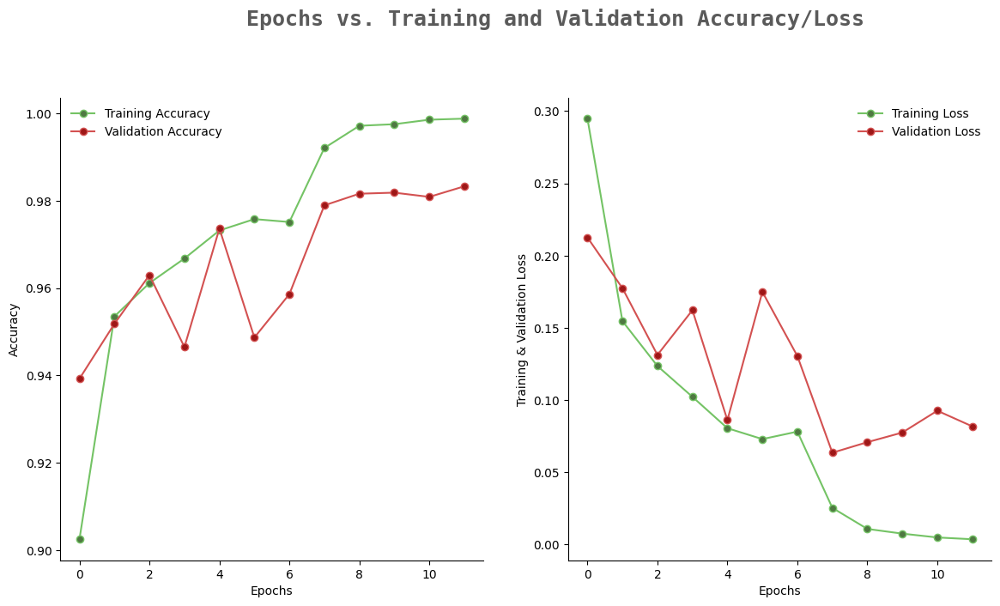

In [42]:
epochs = [i for i in range(12)]
fig, ax = plt.subplots(1,2,figsize=(14,7))
train_acc = history.history['accuracy']
train_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

fig.text(s='Epochs vs. Training and Validation Accuracy/Loss',size=18,fontweight='bold',
             fontname='monospace',color=colors_dark[1],y=1,x=0.28,alpha=0.8)

sns.despine()
ax[0].plot(epochs, train_acc, marker='o',markerfacecolor=colors_green[2],color=colors_green[3],
           label = 'Training Accuracy')
ax[0].plot(epochs, val_acc, marker='o',markerfacecolor=colors_red[2],color=colors_red[3],
           label = 'Validation Accuracy')
ax[0].legend(frameon=False)
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')

sns.despine()
ax[1].plot(epochs, train_loss, marker='o',markerfacecolor=colors_green[2],color=colors_green[3],
           label ='Training Loss')
ax[1].plot(epochs, val_loss, marker='o',markerfacecolor=colors_red[2],color=colors_red[3],
           label = 'Validation Loss')
ax[1].legend(frameon=False)
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Training & Validation Loss')

fig.show()

# 5. Performance analysis on test dataset

In [43]:
pred = model.predict(X_test)
pred = np.argmax(pred,axis=1)
y_test_new = np.argmax(y_test,axis=1)

162/162 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step


## 5.1 Classification Report and confusion metrix

### **`Classification Report`**

- **`classification_report(y_test_new, pred)`**  
  - The classification report provides a detailed summary of the model's performance on the test data.  
  - Metrics included:
    - **Precision:** The proportion of true positive predictions out of all positive predictions.
    - **Recall (Sensitivity):** The proportion of true positive predictions out of actual positives.
    - **F1-Score:** The harmonic mean of precision and recall, balancing both metrics.
    - **Support:** The number of true instances for each class.  

---

### **`Confusion Matrix`**

- **`confusion_matrix(y_test_new, pred)`**  
  - The confusion matrix gives a tabular representation of the model's predictions versus the actual labels.  
  - Rows represent the actual classes, and columns represent the predicted classes.  
  - Components include:
    - **True Positives (TP):** Correctly predicted positive instances.
    - **True Negatives (TN):** Correctly predicted negative instances.
    - **False Positives (FP):** Incorrectly predicted positive instances.
    - **False Negatives (FN):** Incorrectly predicted negative instances.

These metrics allow us to evaluate how well the model classifies the test data, providing insights into strengths and areas for improvement.

In [47]:
cr = classification_report(y_test_new,pred)
cmetric = confusion_matrix(y_test_new,pred)
print(cr)

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1296
           1       0.96      0.95      0.96       995
           2       0.98      0.99      0.99      1453
           3       0.99      1.00      1.00       430
           4       0.97      0.96      0.96       989

    accuracy                           0.98      5163
   macro avg       0.98      0.98      0.98      5163
weighted avg       0.98      0.98      0.98      5163



## 5.2 Visualizing the classification report

In [48]:
raw_data = cr.split("\n")
precision = []
recall = []
f1_score = []
for line in raw_data[2:-5]:
    line = line.split()
    precision.append(float(line[1]))
    recall.append(float(line[2]))
    f1_score.append(float(line[3]))

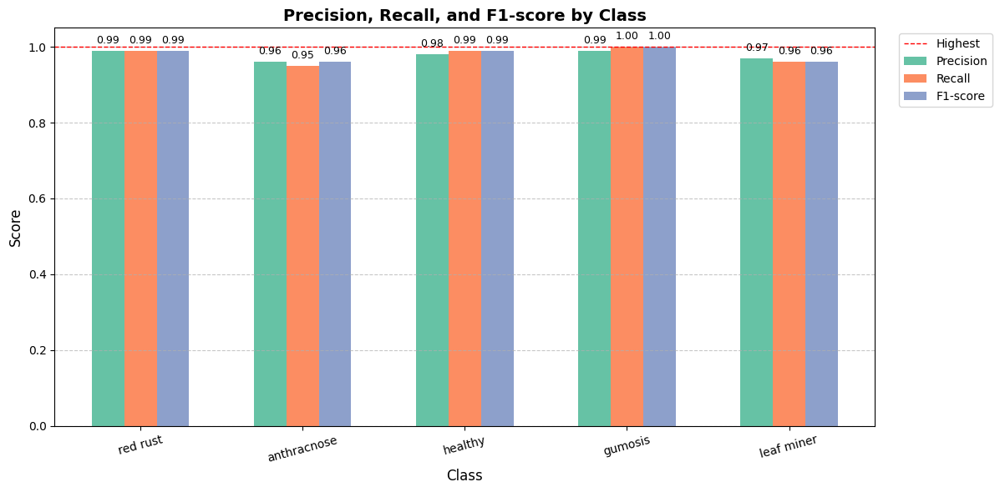

In [55]:
x = np.arange(len(labels))
width = 0.2

colors = sns.color_palette("Set2", 3)

plt.figure(figsize=(12, 6))

plt.bar(x, precision, width, label='Precision', color=colors[0])
plt.bar(x + width, recall, width, label='Recall', color=colors[1])
plt.bar(x + 2 * width, f1_score, width, label='F1-score', color=colors[2])

for i, v in enumerate(precision):
    plt.text(i , v + 0.02, f"{v:.2f}", ha='center', fontsize=9)
for i, v in enumerate(recall):
    plt.text(i + width , v + 0.02, f"{v:.2f}", ha='center', fontsize=9)
for i, v in enumerate(f1_score):
    plt.text(i + 2 * width , v + 0.02, f"{v:.2f}", ha='center', fontsize=9)

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.xlabel('Class', fontsize=12)
plt.ylabel('Score', fontsize=12)
plt.title('Precision, Recall, and F1-score by Class', fontsize=14, fontweight='bold')
plt.xticks(x + width, labels, rotation=15, fontsize=10)
plt.axhline(y=1, color='red', linestyle='--', linewidth=1, label='Highest')

plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1), fontsize=10)

plt.tight_layout()
plt.show()

## 5.3 Visualizing the Confusion Matrix

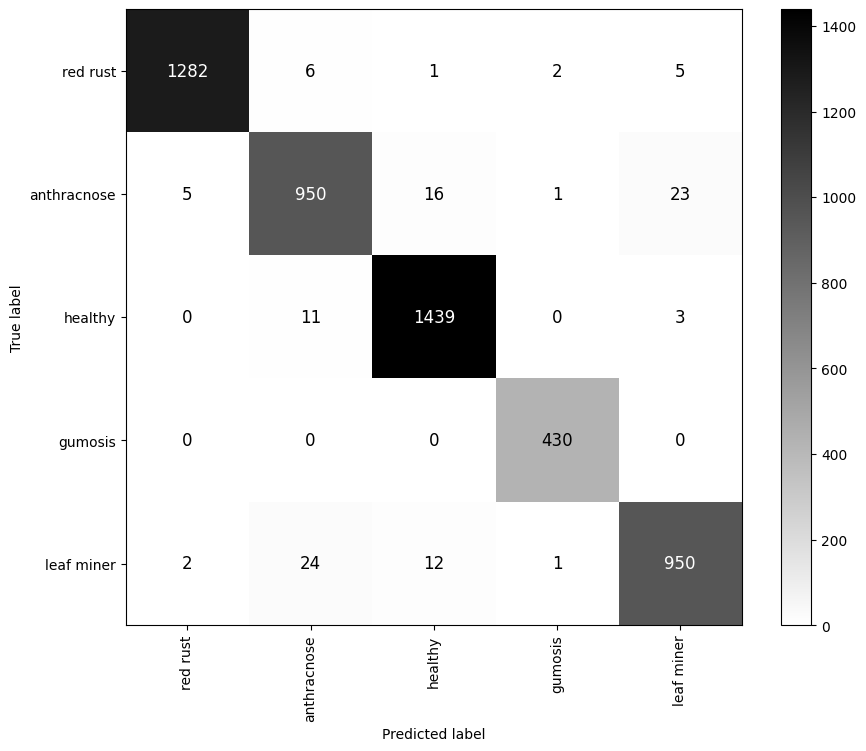

In [56]:
fig, ax = plt.subplots(figsize=(10, 8))

CLASS_NAMES = labels

disp = ConfusionMatrixDisplay(confusion_matrix=cmetric, display_labels=CLASS_NAMES)
disp.plot(ax=ax, cmap='binary')


ax.set_xticks(range(len(CLASS_NAMES))) 
ax.set_xticklabels(CLASS_NAMES, rotation=90) 

ax.set_yticks(range(len(CLASS_NAMES)))  
ax.set_yticklabels(CLASS_NAMES)  

for text in ax.texts:
    text.set_fontsize(12)

ax.set_xlabel('Predicted label')
ax.set_ylabel('True label')

plt.grid(False)
plt.show()

## 5.4 Advanced visualizations

In [57]:
test_predictions = model.predict(X_test)

162/162 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step


In [58]:
y_val_indexes = np.array([val.argmax() for val in tqdm(y_test)])
y_val_indexes[:5]

100%|██████████| 5163/5163 [00:00<00:00, 990676.22it/s]


array([0, 0, 4, 4, 2])

In [59]:
y_test_classes = np.argmax(test_predictions, axis=1)
y_test_classes[0:5]

array([0, 0, 4, 4, 2])

In [60]:
y_test_classes.shape, y_val_indexes.shape

((5163,), (5163,))

In [61]:
y_true = y_val_indexes
accuracy = accuracy_score(y_true, y_test_classes)
accuracy

0.9783071857447221

In [62]:
index = 40
print(test_predictions[index])
print(f"Max value (probability of prediction): {np.max(test_predictions[index])}")
print(f"Sum: {np.sum(test_predictions[index])}")
print(f"Max index: {np.argmax(test_predictions[index])}")
print(f"Predicted label: {CLASS_NAMES[np.argmax(test_predictions[index])]}")

[3.4615238e-10 8.7412627e-10 7.2288189e-09 4.4301933e-07 9.9999952e-01]
Max value (probability of prediction): 0.9999995231628418
Sum: 1.0
Max index: 4
Predicted label: leaf miner


In [63]:
CLASS_NAMES[4]

'leaf miner'

In [64]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return CLASS_NAMES[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(test_predictions[81])
pred_label

'red rust'

In [66]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], CLASS_NAMES[labels[n]], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image.astype("uint8"))
  plt.xticks([])
  plt.yticks([])
    
  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

`plot_pred()` : Provides visualization of model Prediction with confidence percentage and actual Class Name / label.

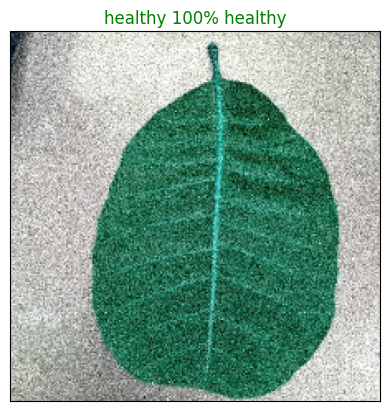

In [67]:
plot_pred(prediction_probabilities=test_predictions,
          labels=y_val_indexes,
          images=X_test,
          n=2400)
plt.show()

In [68]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)
  # Find the top  prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[::-1]

#   print(top_10_pred_indexes)
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = top_10_pred_indexes
  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

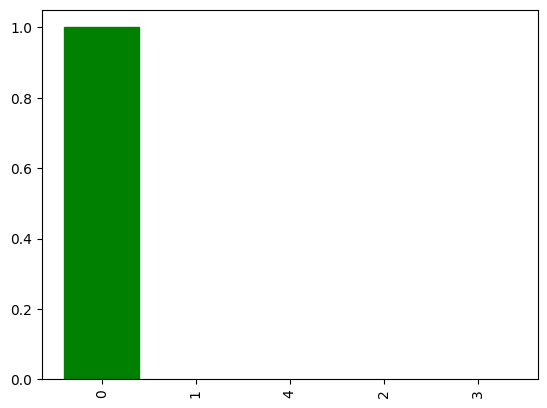

In [69]:
plot_pred_conf(prediction_probabilities = test_predictions,
               labels = y_val_indexes,
               n = 8)

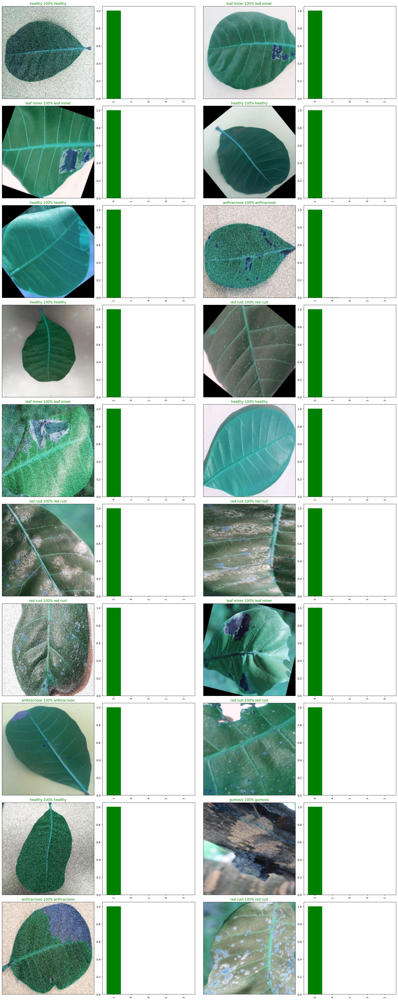

In [70]:
i_multiplier = 20
num_rows = 10
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10 * num_cols, 5 * num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
  plot_pred(prediction_probabilities=test_predictions,
            labels=y_val_indexes,
            images=X_test,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  plot_pred_conf(prediction_probabilities=test_predictions,
                 labels=y_val_indexes,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()